<a href="https://colab.research.google.com/github/Daniel-ASG/Aulas_de_cursos/blob/main/GeoPandas.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install geopandas

# Parte 1: Trabalhando com dados Geoespaciais

## Entendendo o funcionamento do GeoPandas

In [2]:
import geopandas as gpd

In [3]:
import zipfile
import requests

### Fonte de dados

https://geoftp.ibge.gov.br/organizacao_do_territorio/malhas_territoriais/malhas_municipais/municipio_2019/UFs/

In [4]:
# faz download do arquivo contendo os dados que serão usados nesta análise
 
file_url = "https://caelum-online-public.s3.amazonaws.com/985-geopandas/01/Mapas.zip"
	
r = requests.get(file_url, stream = True) 

with open('/content/Mapas.zip', 'wb') as file: 
	for block in r.iter_content(chunk_size = 1024): 
		if block: 
			file.write(block) 
   



# #descompacta o arquivo baixado anteriormente

!unzip '/content/Mapas.zip' -d '/content'

Archive:  /content/Mapas.zip
replace /content/Mapas/RJ/33MUE250GC_SIR.shx? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [5]:
rj = gpd.read_file('/content/Mapas/RJ/33MUE250GC_SIR.shp')

In [6]:
type(rj)

geopandas.geodataframe.GeoDataFrame

In [7]:
rj

,ID,CD_GEOCODM,NM_MUNICIP,geometry
0,1468,3300100,ANGRA DOS REIS,"MULTIPOLYGON (((-44.33208 -23.02384, -44.33221..."
1,1469,3300159,APERIBÉ,"POLYGON ((-42.08950 -21.62893, -42.08912 -21.6..."
2,1470,3300209,ARARUAMA,"POLYGON ((-42.22526 -22.59253, -42.22521 -22.5..."
3,1471,3300225,AREAL,"POLYGON ((-43.16007 -22.20005, -43.16003 -22.1..."
4,1472,3300233,ARMAÇÃO DOS BÚZIOS,"MULTIPOLYGON (((-41.98427 -22.74458, -41.98296..."
...,...,...,...,...
87,1555,3306008,TRÊS RIOS,"POLYGON ((-43.13666 -22.10933, -43.13182 -22.1..."
88,1556,3306107,VALENÇA,"POLYGON ((-43.82120 -22.08844, -43.82101 -22.0..."
89,1557,3306156,VARRE-SAI,"POLYGON ((-41.82695 -20.84164, -41.82686 -20.8..."
90,1558,3306206,VASSOURAS,"POLYGON ((-43.61208 -22.30841, -43.61113 -22.3..."


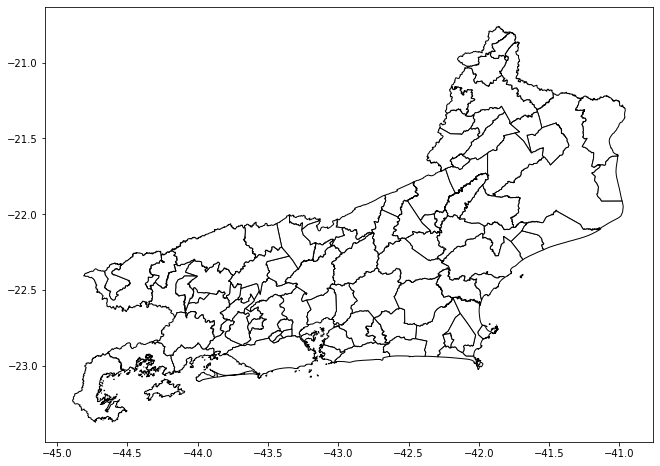

In [8]:
rj.plot(color='white', edgecolor='black', figsize=(15,8));

In [9]:
from shapely.geometry import Polygon, Point, LineString, MultiPolygon

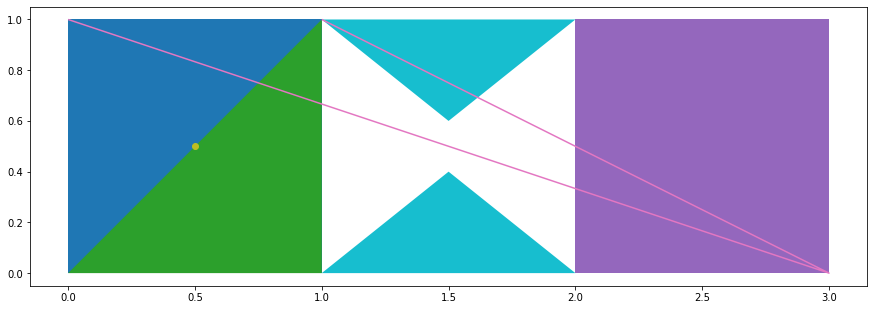

In [10]:
p1 = Polygon([(0,0), (1,0), (1,1), (0,1)])
p2 = Polygon([(0,0), (1,0), (1,1)])
p3 = Polygon([(2,0), (3,0), (3,1), (2,1)])
p4 = LineString([(0,1), (3,0), (1,1)])
p5 = Point(0.5, 0.5)
p6 = Polygon([(1,0), (1.5,0.4), (2,0)])
p7 = Polygon([(1,1), (1.5,0.6), (2,1)])
p8 = MultiPolygon([p6, p7])

g = gpd.GeoSeries([p1, p2, p3, p4, p5, p8])
g.plot(cmap='tab10', figsize=(15,8));

In [11]:
g

0    POLYGON ((0.00000 0.00000, 1.00000 0.00000, 1....
1    POLYGON ((0.00000 0.00000, 1.00000 0.00000, 1....
2    POLYGON ((2.00000 0.00000, 3.00000 0.00000, 3....
3    LINESTRING (0.00000 1.00000, 3.00000 0.00000, ...
4                              POINT (0.50000 0.50000)
5    MULTIPOLYGON (((1.00000 0.00000, 1.50000 0.400...
dtype: geometry

## Criando Shapefiles

In [12]:
rj = rj[rj['NM_MUNICIP'] == 'RIO DE JANEIRO']

In [13]:
rj

,ID,CD_GEOCODM,NM_MUNICIP,geometry
67,1535,3304557,RIO DE JANEIRO,"MULTIPOLYGON (((-43.12376 -22.80712, -43.12380..."


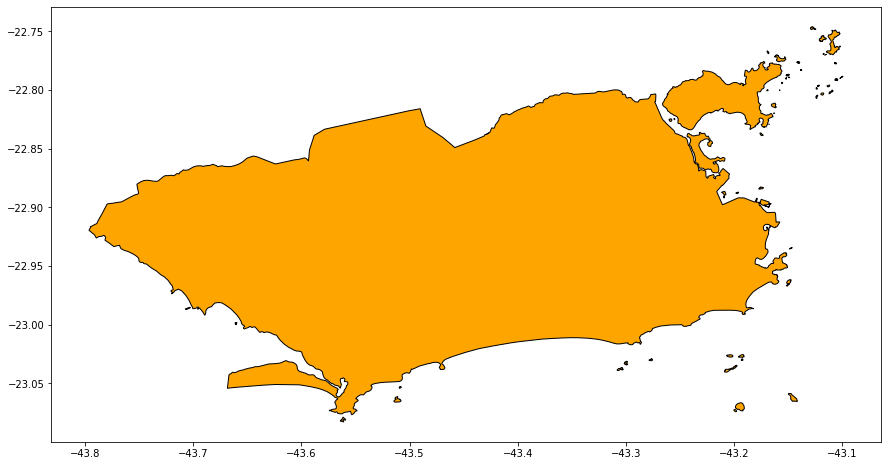

In [14]:
rj.plot(color='orange', edgecolor='black', figsize=(15,8));

### Salvando

In [15]:
import os

dir = '/content/Mapas/RJ-MUNIC'
if not os.path.exists(dir):
    os.makedirs(dir)

In [16]:
rj.to_file(dir + '/RJ-MUNIC.shp')

## Transformando DataFrame em GeoDataFrame

In [17]:
import pandas as pd

In [18]:
dados = pd.read_table('https://raw.githubusercontent.com/Daniel-ASG/Aulas_de_cursos/main/dados.txt')
dados.head()

,Area,Bairro,Cidade,Endereco,Estado,Latitude,Longitude,Quartos,Suites,Vagas,Tipo,Transacao,Valor
0,138,Recreio dos Bandeirantes,Rio de Janeiro,Rua Vicente Scofano,RJ,-23.016455,-43.462946,3,1,3,Apartamento,Venda,1095000
1,133,Freguesia (Jacarepaguá),Rio de Janeiro,Rua Potiguara,RJ,-22.943199,-43.336911,3,1,2,Apartamento,Venda,650000
2,46,Pilares,Rio de Janeiro,Rua Professor Carneiro Felipe,RJ,-22.873849,-43.300517,1,0,0,Apartamento,Venda,150000
3,65,Barra da Tijuca,Rio de Janeiro,Avenida Salvador Allende,RJ,-22.984787,-43.412703,2,1,1,Apartamento,Venda,430000
4,85,Gávea,Rio de Janeiro,Rua Marquês de São Vicente,RJ,-14.235004,-51.925280,2,1,2,Apartamento,Venda,1800000


In [19]:
from shapely.geometry import Point

In [20]:
x = zip(dados.Longitude, dados.Latitude)
x

In [21]:
list(x)

[(-43.4629464, -23.0164552),
 (-43.3369111, -22.9431995),
 (-43.300517, -22.873849),
 (-43.4127033, -22.9847874),
 (-51.92528, -14.235004),
 (-43.477504700000004, -23.0189271),
 (-43.247108700000005, -22.933574899999996),
 (-43.192534, -22.9823004),
 (-51.92528, -14.235004),
 (-43.175411, -22.9364023),
 (-43.262945, -22.918533),
 (-49.0606445, -26.922570899999997),
 (-43.303056, -23.013213),
 (-43.1698189, -22.952982000000002),
 (-43.1849587, -22.970644399999998),
 (-43.354812100000004, -23.0097423),
 (-49.0606445, -26.922570899999997),
 (-43.3461644, -22.938107000000002),
 (-43.181953799999995, -22.9497255),
 (-43.2327966, -22.9218818),
 (-43.3939698, -22.9995191),
 (-43.280851500000004, -22.9055097),
 (-43.1875152, -22.934498),
 (-43.5016663, -23.019108300000003),
 (-43.45904960000001, -23.023215),
 (-43.233903399999996, -22.9936095),
 (-43.1987716, -22.985367999999998),
 (-43.230810600000005, -22.9771863),
 (-43.2525968, -22.926766600000004),
 (-51.92528, -14.235004),
 (-43.18529320

In [22]:
geometry = [Point(x) for x in zip(dados.Longitude, dados.Latitude)]

In [23]:
crs = {'proj': 'latlong', 'ellps':'WGS84', 'datun':'WGS84', 'no_defs':True}
geo_dados = gpd.GeoDataFrame(dados, crs=crs, geometry=geometry)

In [24]:
geo_dados

,Area,Bairro,Cidade,Endereco,Estado,Latitude,Longitude,Quartos,Suites,Vagas,Tipo,Transacao,Valor,geometry
0,138,Recreio dos Bandeirantes,Rio de Janeiro,Rua Vicente Scofano,RJ,-23.016455,-43.462946,3,1,3,Apartamento,Venda,1095000,POINT (-43.46295 -23.01646)
1,133,Freguesia (Jacarepaguá),Rio de Janeiro,Rua Potiguara,RJ,-22.943199,-43.336911,3,1,2,Apartamento,Venda,650000,POINT (-43.33691 -22.94320)
2,46,Pilares,Rio de Janeiro,Rua Professor Carneiro Felipe,RJ,-22.873849,-43.300517,1,0,0,Apartamento,Venda,150000,POINT (-43.30052 -22.87385)
3,65,Barra da Tijuca,Rio de Janeiro,Avenida Salvador Allende,RJ,-22.984787,-43.412703,2,1,1,Apartamento,Venda,430000,POINT (-43.41270 -22.98479)
4,85,Gávea,Rio de Janeiro,Rua Marquês de São Vicente,RJ,-14.235004,-51.925280,2,1,2,Apartamento,Venda,1800000,POINT (-51.92528 -14.23500)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,48,Campo Grande,Rio de Janeiro,Rua Josué de Barros,RJ,-22.878349,-43.550762,2,0,1,Apartamento,Venda,170000,POINT (-43.55076 -22.87835)
4996,75,Recreio dos Bandeirantes,Rio de Janeiro,Rua Le Corbusier,RJ,-23.024717,-43.487285,3,1,1,Apartamento,Venda,550000,POINT (-43.48729 -23.02472)
4997,32,Jardim Botânico,Rio de Janeiro,Rua Getúlio das Neves,RJ,-22.959433,-43.206180,1,0,0,Apartamento,Venda,580000,POINT (-43.20618 -22.95943)
4998,85,Grajaú,Rio de Janeiro,Rua Jerônimo de Lemos,RJ,-22.918773,-43.260492,3,0,0,Apartamento,Venda,325000,POINT (-43.26049 -22.91877)


In [25]:
dir = '/content/Mapas/RJ-DATASET'
if not os.path.exists(dir):
    os.makedirs(dir)

In [26]:
geo_dados.to_file(dir + '/DATASET.shp')

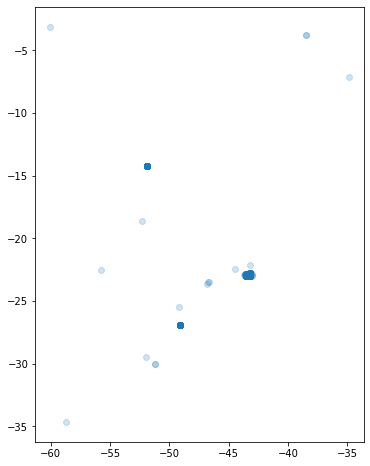

In [27]:
geo_dados.plot(figsize=(15,8), alpha=0.2)

## Modificando o sistema de coordenadas

### Fonte de dados

http://www.spatialreference.org/

https://www.lapig.iesa.ufg.br/lapig/cursos_online/gvsig/a_projeo_utm_no_brasil.html

![UTM_Brasil[1].png](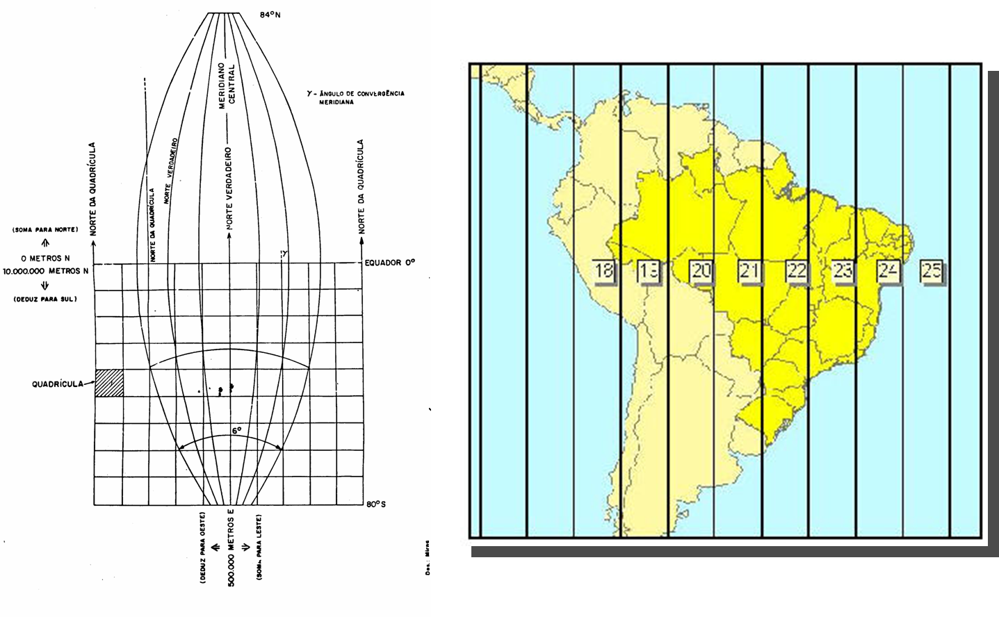)

In [28]:
rj.crs

<Geographic 2D CRS: EPSG:4674>
Name: SIRGAS 2000
Axis Info [ellipsoidal]:
- lon[east]: Longitude (Degree)
- lat[north]: Latitude (Degree)
Area of Use:
- undefined
Datum: SIRGAS2000
- Ellipsoid: Geodetic_Reference_System_of_1980
- Prime Meridian: Greenwich

In [29]:
geo_dados.crs

<Geographic 2D CRS: +proj=latlong +ellps=WGS84 +datun=WGS84 +no_defs + ...>
Name: unknown
Axis Info [ellipsoidal]:
- lon[east]: Longitude (degree)
- lat[north]: Latitude (degree)
Area of Use:
- undefined
Datum: Unknown based on WGS84 ellipsoid
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [30]:
rj = rj.to_crs('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')

In [31]:
geo_dados = geo_dados.to_crs('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')

In [32]:
rj.crs

<Bound CRS: +proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0, ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (kilometre)
- N[north]: Northing (kilometre)
Area of Use:
- undefined
Coordinate Operation:
- name: Transformation from unknown to WGS84
- method: Position Vector transformation (geog2D domain)
Datum: Unknown based on GRS80 ellipsoid
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich
Source CRS: unknown

In [33]:
geo_dados.crs

<Bound CRS: +proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0, ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (kilometre)
- N[north]: Northing (kilometre)
Area of Use:
- undefined
Coordinate Operation:
- name: Transformation from unknown to WGS84
- method: Position Vector transformation (geog2D domain)
Datum: Unknown based on GRS80 ellipsoid
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich
Source CRS: unknown

In [34]:
rj.to_file('/content/Mapas/RJ-MUNIC/RJ-MUNIC.shp')
geo_dados.to_file('/content/Mapas/RJ-DATASET/DATASET.shp')

In [35]:
rj2 = gpd.read_file('/content/Mapas/RJ-MUNIC/RJ-MUNIC.shp')
rj2

,ID,CD_GEOCODM,NM_MUNICIP,geometry
0,1535,3304557,RIO DE JANEIRO,"MULTIPOLYGON (((692.576 7476.609, 692.572 7476..."


In [36]:
rj2.crs

<Projected CRS: PROJCS["Transverse_Mercator",GEOGCS["GCS_unknown", ...>
Name: Transverse_Mercator
Axis Info [cartesian]:
- E[east]: Easting (kilometre)
- N[north]: Northing (kilometre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Transverse Mercator
Datum: Unknown based on GRS80 ellipsoid
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

## Selecionando pontos dentro de uma região

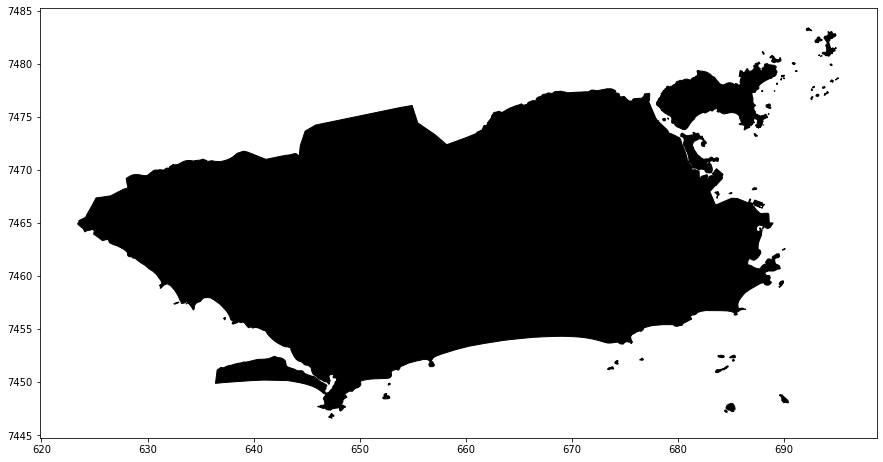

In [37]:
rj.plot(color='black', edgecolor='black', figsize=(15,8))

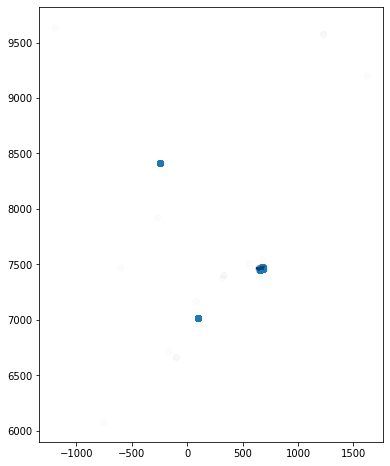

In [38]:
base = rj.plot(color='black', edgecolor='black', figsize=(15,8))
geo_dados.plot(ax=base, figsize=(15,8), alpha=0.02)

In [39]:
rj.iloc[0]

ID                                                         1535
CD_GEOCODM                                              3304557
NM_MUNICIP                                       RIO DE JANEIRO
geometry      (POLYGON ((692.5758012880638 7476.609203982483...
Name: 67, dtype: object

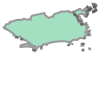

In [40]:
rj.iloc[0].geometry

In [41]:
geo_dados.iloc[0]

Area                                                 138
Bairro                          Recreio dos Bandeirantes
Cidade                                    Rio de Janeiro
Endereco                             Rua Vicente Scofano
Estado                                                RJ
Latitude                                        -23.0165
Longitude                                       -43.4629
Quartos                                                3
Suites                                                 1
Vagas                                                  3
Tipo                                         Apartamento
Transacao                                          Venda
Valor                                            1095000
geometry     POINT (657.5137068691058 7453.832425203198)
Name: 0, dtype: object

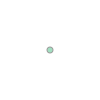

In [42]:
geo_dados.iloc[0].geometry

In [43]:
geo_dados.iloc[0].geometry.within(rj.iloc[0].geometry)

True

In [44]:
rj.iloc[0].geometry.contains(geo_dados.iloc[0].geometry)

True

In [45]:
geo_dados['geometry'].within(rj.iloc[0].geometry)

0        True
1        True
2        True
3        True
4       False
        ...  
4995     True
4996     True
4997     True
4998     True
4999     True
Length: 5000, dtype: bool

In [46]:
amostra = geo_dados.iloc[:12]
amostra

,Area,Bairro,Cidade,Endereco,Estado,Latitude,Longitude,Quartos,Suites,Vagas,Tipo,Transacao,Valor,geometry
0,138,Recreio dos Bandeirantes,Rio de Janeiro,Rua Vicente Scofano,RJ,-23.016455,-43.462946,3,1,3,Apartamento,Venda,1095000,POINT (657.514 7453.832)
1,133,Freguesia (Jacarepaguá),Rio de Janeiro,Rua Potiguara,RJ,-22.943199,-43.336911,3,1,2,Apartamento,Venda,650000,POINT (670.524 7461.803)
2,46,Pilares,Rio de Janeiro,Rua Professor Carneiro Felipe,RJ,-22.873849,-43.300517,1,0,0,Apartamento,Venda,150000,POINT (674.345 7469.440)
3,65,Barra da Tijuca,Rio de Janeiro,Avenida Salvador Allende,RJ,-22.984787,-43.412703,2,1,1,Apartamento,Venda,430000,POINT (662.701 7457.284)
4,85,Gávea,Rio de Janeiro,Rua Marquês de São Vicente,RJ,-14.235004,-51.925280,2,1,2,Apartamento,Venda,1800000,POINT (-248.715 8415.117)
5,260,Recreio dos Bandeirantes,Rio de Janeiro,Rua Desembargador Paulo Alonso,RJ,-23.018927,-43.477505,3,1,2,Apartamento,Venda,1160000,POINT (656.019 7453.574)
6,74,Tijuca,Rio de Janeiro,Rua Amoroso Costa,RJ,-22.933575,-43.247109,3,2,1,Apartamento,Venda,595000,POINT (679.746 7462.762)
7,200,Copacabana,Rio de Janeiro,Rua Souza Lima,RJ,-22.982300,-43.192534,4,1,1,Apartamento,Venda,2100000,POINT (685.278 7457.298)
8,119,Barra da Tijuca,Rio de Janeiro,Península Fit,RJ,-14.235004,-51.925280,3,2,2,Apartamento,Venda,1130000,POINT (-248.715 8415.117)
9,88,Flamengo,Rio de Janeiro,Rua Senador Vergueiro,RJ,-22.936402,-43.175411,2,2,1,Apartamento,Venda,1450000,POINT (687.096 7462.359)


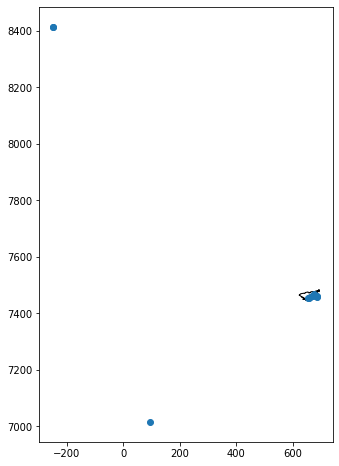

In [47]:
base = rj.plot(color='white', edgecolor='black', figsize=(15,8))
amostra.plot(ax=base, figsize=(15,8), alpha=1)

In [48]:
antes = geo_dados.shape[0]
antes

5000

In [49]:
geo_dados = geo_dados[geo_dados['geometry'].within(rj.iloc[0].geometry)]

In [50]:
depois = geo_dados.shape[0]
depois

4513

In [51]:
antes - depois

487

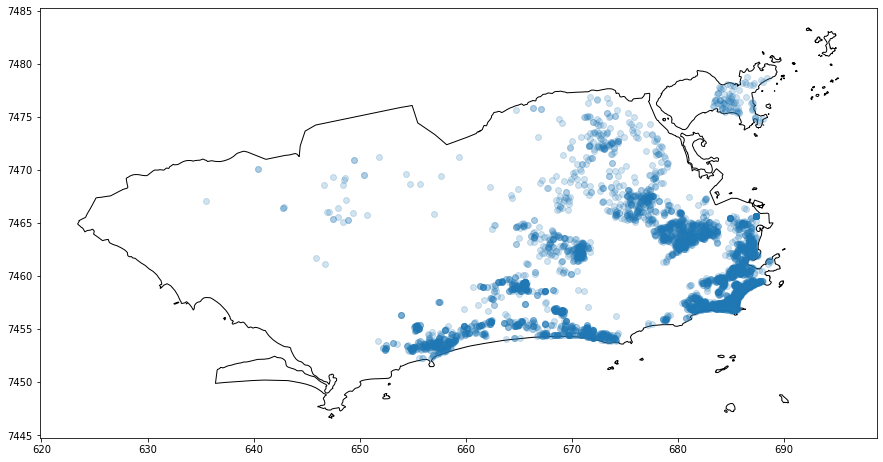

In [52]:
base = rj.plot(color='white', edgecolor='black', figsize=(15,8))
geo_dados.plot(ax=base, figsize=(15,8), alpha=0.2)

In [53]:
geo_dados.to_file('/content/Mapas/RJ-DATASET/DATASET.shp')

## Distâncias até a estação de metrô mais próxima

### Fonte de dados
* www.data.rio
* https://www.data.rio/datasets/esta%C3%A7%C3%B5es-metr%C3%B4
* https://opendata.arcgis.com/datasets/7a0b22723c5a458faaae79f046163504_19.geojson

In [54]:
metro = gpd.read_file('https://opendata.arcgis.com/datasets/7a0b22723c5a458faaae79f046163504_19.geojson')
metro.head()

,OBJECTID,Cod,Nome,Flg_ATM,Flg_Bicicletario,Flg_Elevador,Flg_Linha1,Flg_Linha2,Obs,Flg_Ativa,Status,Data_Inc,Flg_Linha4,Integra_Trem,Integra_Onibus,Integra_BRT,Corredor,Integra_VLT,Onibus,Flg_Metro_Superficie,Metro_Superficie,Data_Inauguracao,geometry
0,1,1,Pavuna,1,1.0,1.0,0,1,None,1,None,1970-01-01T00:00:00+00:00,0,1,0,0,None,0,None,0,None,1998,POINT (-43.36485 -22.80662)
1,2,2,Engenheiro Rubens Paiva,1,1.0,1.0,0,1,None,1,None,1970-01-01T00:00:00+00:00,0,0,0,0,None,0,None,0,None,1998,POINT (-43.35845 -22.81627)
2,3,3,Acari / Fazenda Botafogo,0,0.0,0.0,0,1,None,1,None,1970-01-01T00:00:00+00:00,0,0,0,0,None,0,None,0,None,1998,POINT (-43.34964 -22.82452)
3,4,4,Coelho Neto,1,0.0,0.0,0,1,None,1,None,1970-01-01T00:00:00+00:00,0,0,0,0,None,0,None,0,None,1998,POINT (-43.34326 -22.83148)
4,5,5,Colégio,1,1.0,0.0,0,1,None,1,None,1970-01-01T00:00:00+00:00,0,0,0,0,None,0,None,0,None,1998,POINT (-43.33386 -22.84269)


In [55]:
metro.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [56]:
metro = metro.to_crs('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')

In [57]:
metro.crs

<Bound CRS: +proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0, ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (kilometre)
- N[north]: Northing (kilometre)
Area of Use:
- undefined
Coordinate Operation:
- name: Transformation from unknown to WGS84
- method: Position Vector transformation (geog2D domain)
Datum: Unknown based on GRS80 ellipsoid
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich
Source CRS: unknown

In [58]:
metro.head()

,OBJECTID,Cod,Nome,Flg_ATM,Flg_Bicicletario,Flg_Elevador,Flg_Linha1,Flg_Linha2,Obs,Flg_Ativa,Status,Data_Inc,Flg_Linha4,Integra_Trem,Integra_Onibus,Integra_BRT,Corredor,Integra_VLT,Onibus,Flg_Metro_Superficie,Metro_Superficie,Data_Inauguracao,geometry
0,1,1,Pavuna,1,1.0,1.0,0,1,None,1,None,1970-01-01T00:00:00+00:00,0,1,0,0,None,0,None,0,None,1998,POINT (667.827 7476.959)
1,2,2,Engenheiro Rubens Paiva,1,1.0,1.0,0,1,None,1,None,1970-01-01T00:00:00+00:00,0,0,0,0,None,0,None,0,None,1998,POINT (668.471 7475.883)
2,3,3,Acari / Fazenda Botafogo,0,0.0,0.0,0,1,None,1,None,1970-01-01T00:00:00+00:00,0,0,0,0,None,0,None,0,None,1998,POINT (669.365 7474.959)
3,4,4,Coelho Neto,1,0.0,0.0,0,1,None,1,None,1970-01-01T00:00:00+00:00,0,0,0,0,None,0,None,0,None,1998,POINT (670.012 7474.182)
4,5,5,Colégio,1,1.0,0.0,0,1,None,1,None,1970-01-01T00:00:00+00:00,0,0,0,0,None,0,None,0,None,1998,POINT (670.963 7472.930)


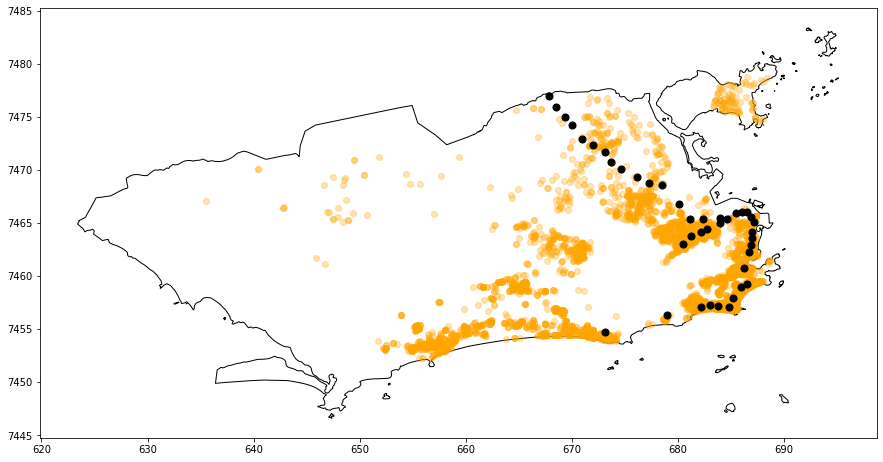

In [59]:
base = rj.plot(color='white', edgecolor='black', figsize=(15,8))
geo_dados.plot(ax=base, color='orange', alpha=0.3)
metro.plot(ax=base, color='black', markersize=50)

In [60]:
geo_dados.iloc[0]

Area                                                 138
Bairro                          Recreio dos Bandeirantes
Cidade                                    Rio de Janeiro
Endereco                             Rua Vicente Scofano
Estado                                                RJ
Latitude                                        -23.0165
Longitude                                       -43.4629
Quartos                                                3
Suites                                                 1
Vagas                                                  3
Tipo                                         Apartamento
Transacao                                          Venda
Valor                                            1095000
geometry     POINT (657.5137068691058 7453.832425203198)
Name: 0, dtype: object

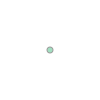

In [61]:
geo_dados.iloc[0].geometry

In [62]:
distances = metro.distance(geo_dados.iloc[0].geometry)
distances

0     25.321516
1     24.623350
2     24.224237
3     23.881158
4     23.357575
5     23.523396
6     23.658163
7     23.401048
8     23.644084
9     24.209373
10    24.795188
11    25.596665
12    26.033173
13    26.295764
14    27.398579
15    28.659654
16    25.773027
17    26.716983
18    27.377518
19    30.455326
20    31.034097
21    31.466395
22    31.662650
23    31.695780
24    31.232661
25    31.026518
26    30.727260
27    30.401336
28    29.515734
29    29.476829
30    28.850631
31    29.407590
32    27.940690
33    28.901631
34    27.475584
35    24.743520
36    26.507063
37    25.728350
38    24.822792
39    21.589055
40    15.622939
dtype: float64

In [63]:
distances.min()

15.62293882499506

In [64]:
geo_dados['Dist_Metro'] = geo_dados['geometry'].apply(lambda x: metro.distance(x).min())

In [65]:
geo_dados.head()

,Area,Bairro,Cidade,Endereco,Estado,Latitude,Longitude,Quartos,Suites,Vagas,Tipo,Transacao,Valor,geometry,Dist_Metro
0,138,Recreio dos Bandeirantes,Rio de Janeiro,Rua Vicente Scofano,RJ,-23.016455,-43.462946,3,1,3,Apartamento,Venda,1095000,POINT (657.514 7453.832),15.622939
1,133,Freguesia (Jacarepaguá),Rio de Janeiro,Rua Potiguara,RJ,-22.943199,-43.336911,3,1,2,Apartamento,Venda,650000,POINT (670.524 7461.803),7.530741
2,46,Pilares,Rio de Janeiro,Rua Professor Carneiro Felipe,RJ,-22.873849,-43.300517,1,0,0,Apartamento,Venda,150000,POINT (674.345 7469.440),0.736973
3,65,Barra da Tijuca,Rio de Janeiro,Avenida Salvador Allende,RJ,-22.984787,-43.412703,2,1,1,Apartamento,Venda,430000,POINT (662.701 7457.284),10.718039
5,260,Recreio dos Bandeirantes,Rio de Janeiro,Rua Desembargador Paulo Alonso,RJ,-23.018927,-43.477505,3,1,2,Apartamento,Venda,1160000,POINT (656.019 7453.574),17.131159


In [66]:
geo_dados.corr()

,Area,Latitude,Longitude,Quartos,Suites,Vagas,Valor,Dist_Metro
Area,1.000000,-0.289299,0.029982,0.681112,0.585817,0.594699,0.724397,-0.036671
Latitude,-0.289299,1.000000,0.292822,-0.225226,-0.346480,-0.274707,-0.299038,-0.217864
Longitude,0.029982,0.292822,1.000000,-0.016882,-0.221548,-0.283960,0.191868,-0.874788
Quartos,0.681112,-0.225226,-0.016882,1.000000,0.529611,0.520499,0.481216,0.021794
Suites,0.585817,-0.346480,-0.221548,0.529611,1.000000,0.621140,0.464075,0.188521
Vagas,0.594699,-0.274707,-0.283960,0.520499,0.621140,1.000000,0.456596,0.215787
Valor,0.724397,-0.299038,0.191868,0.481216,0.464075,0.456596,1.000000,-0.195641
Dist_Metro,-0.036671,-0.217864,-0.874788,0.021794,0.188521,0.215787,-0.195641,1.000000


In [67]:
coef = geo_dados['Valor'].corr(geo_dados['Dist_Metro'])
coef

-0.195640831616868

In [68]:
geo_dados.to_file('/content/Mapas/RJ-DATASET/DATASET.shp')

## Agregando outros tipos de transporte

### Fontes de dados
Trens
* https://www.data.rio/datasets/esta%C3%A7%C3%B5es-trem
* https://opendata.arcgis.com/datasets/8c9f264be1e946b1b49cf4c198bd5e46_16.geojson

BRT
* https://www.data.rio/datasets/esta%C3%A7%C3%B5es-brt
* https://opendata.arcgis.com/datasets/f753941f44a749d4987f1111aa6486b3_22.geojson

#### Estações de trem

In [69]:
trem = gpd.read_file('https://opendata.arcgis.com/datasets/8c9f264be1e946b1b49cf4c198bd5e46_16.geojson')
trem.head()

,OBJECTID,Cod,Nome,Flg_IntegraOnibus,Flg_IntegraMetro,Flg_Terminal,Flg_TransfRamal,Flg_TransfCentral,Flg_IntegraTele,Flg_Mun,Flg_Ativa,Status,Flg_BelfordRoxo,Flg_Saracuruna,Flg_Deodoro,Flg_SantaCruz,Flg_Japeri,Flg_Paracambi,Flg_VilaInhomirim,Flg_Guapimirim,Data_Inc,Integra_BRT,Corredor_BRT,geometry
0,1,60,Nova Iguaçu,NaN,NaN,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1970-01-01T00:00:00+00:00,NaN,None,POINT (-43.44939 -22.76073)
1,2,20,Comendador Soares,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1970-01-01T00:00:00+00:00,NaN,None,POINT (-43.48895 -22.74415)
2,3,4,Austin,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1970-01-01T00:00:00+00:00,NaN,None,POINT (-43.52271 -22.72031)
3,4,81,Queimados,NaN,NaN,1.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1970-01-01T00:00:00+00:00,NaN,None,POINT (-43.55610 -22.71624)
4,5,29,Engenheiro Pedreira,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1970-01-01T00:00:00+00:00,NaN,None,POINT (-43.60606 -22.67875)


In [70]:
trem = trem.to_crs('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')
trem.crs

<Bound CRS: +proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0, ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (kilometre)
- N[north]: Northing (kilometre)
Area of Use:
- undefined
Coordinate Operation:
- name: Transformation from unknown to WGS84
- method: Position Vector transformation (geog2D domain)
Datum: Unknown based on GRS80 ellipsoid
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich
Source CRS: unknown

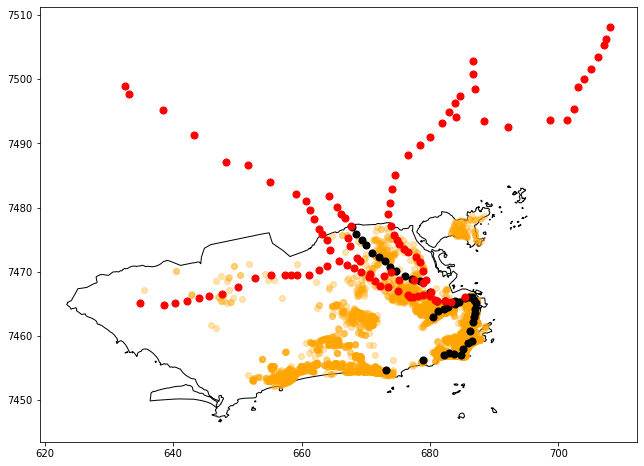

In [71]:
base = rj.plot(color='white', edgecolor='black', figsize=(15,8))
geo_dados.plot(ax=base, color='orange', alpha=0.3)
metro.plot(ax=base, color='black', markersize=50)
trem.plot(ax=base, color='red', markersize=50)

In [72]:
trem = trem[trem.within(rj.iloc[0].geometry)]

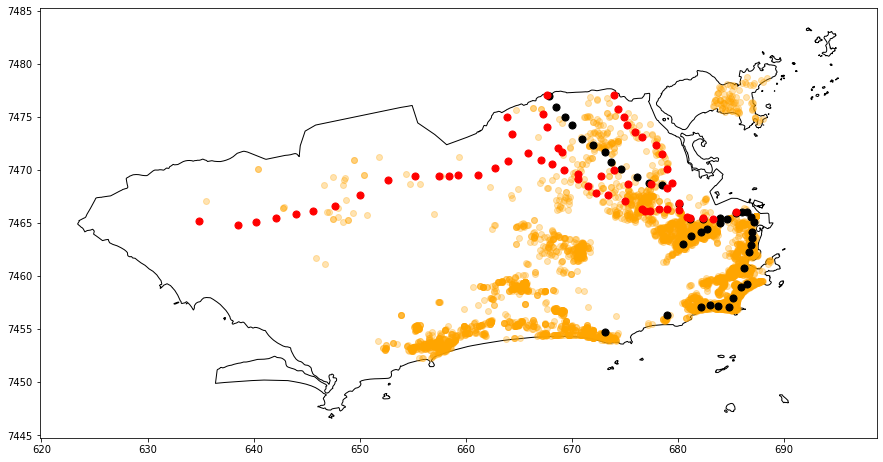

In [73]:
base = rj.plot(color='white', edgecolor='black', figsize=(15,8))
geo_dados.plot(ax=base, color='orange', alpha=0.3)
metro.plot(ax=base, color='black', markersize=50)
trem.plot(ax=base, color='red', markersize=50)

#### Estações BRT

In [74]:
BRT = gpd.read_file('https://opendata.arcgis.com/datasets/f753941f44a749d4987f1111aa6486b3_22.geojson')
BRT.head()

,OBJECTID,Nome,Flg_Ativo,Status,X,Y,Flg_TransCarioca,Flg_TransBrasil,Flg_TransOeste,Flg_TransOlimpica,ChaveGeo,Data_Inc,Integra_Trem,Integra_Metro,Integra_Aeroporto,geometry
0,1,Santa Luzia,1,1,679342.4694,7.471500e+06,1,0,0,0,None,1970-01-01T00:00:00+00:00,0.0,0.0,0.0,POINT (-43.25244 -22.85513)
1,2,Maré,1,1,680236.1565,7.472380e+06,1,0,0,0,None,1970-01-01T00:00:00+00:00,0.0,0.0,0.0,POINT (-43.24383 -22.84709)
2,3,Cardoso de Moraes - Viúva Garcia,1,1,678744.0560,7.471252e+06,1,0,0,0,None,1970-01-01T00:00:00+00:00,0.0,0.0,0.0,POINT (-43.25824 -22.85743)
3,4,Penha I,1,1,676833.5642,7.473029e+06,1,0,0,0,None,1970-01-01T00:00:00+00:00,0.0,0.0,0.0,POINT (-43.27706 -22.84158)
4,5,Penha II,1,1,676873.5062,7.472977e+06,1,0,0,0,None,1970-01-01T00:00:00+00:00,0.0,0.0,0.0,POINT (-43.27666 -22.84205)


In [75]:
BRT = BRT.to_crs('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')
BRT.crs

<Bound CRS: +proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0, ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (kilometre)
- N[north]: Northing (kilometre)
Area of Use:
- undefined
Coordinate Operation:
- name: Transformation from unknown to WGS84
- method: Position Vector transformation (geog2D domain)
Datum: Unknown based on GRS80 ellipsoid
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich
Source CRS: unknown

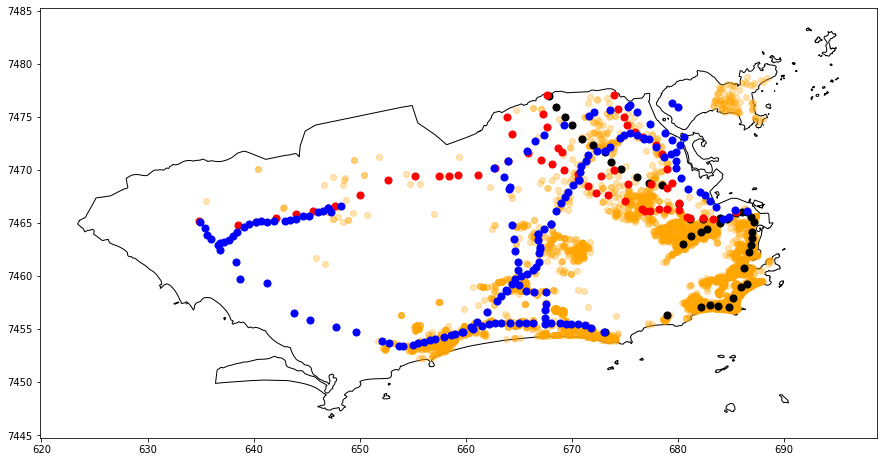

In [76]:
base = rj.plot(color='white', edgecolor='black', figsize=(15,8))
geo_dados.plot(ax=base, color='orange', alpha=0.3)
metro.plot(ax=base, color='black', markersize=50)
trem.plot(ax=base, color='red', markersize=50)
BRT.plot(ax=base, color='blue', markersize=50)

In [77]:
transporte = pd.concat([trem.geometry, metro.geometry, BRT.geometry], ignore_index=True)
transporte

0      POINT (676.866 7466.079)
1      POINT (663.964 7470.815)
2      POINT (662.792 7470.218)
3      POINT (661.119 7469.485)
4      POINT (659.274 7469.469)
                 ...           
257    POINT (664.056 7468.207)
258    POINT (663.576 7469.330)
259    POINT (662.677 7470.133)
260    POINT (663.983 7470.796)
261    POINT (664.181 7468.397)
Length: 262, dtype: geometry

In [78]:
geo_dados['Dist_Transporte'] = geo_dados['geometry'].apply(lambda x: transporte.distance(x).min())
geo_dados.head()

,Area,Bairro,Cidade,Endereco,Estado,Latitude,Longitude,Quartos,Suites,Vagas,Tipo,Transacao,Valor,geometry,Dist_Metro,Dist_Transporte
0,138,Recreio dos Bandeirantes,Rio de Janeiro,Rua Vicente Scofano,RJ,-23.016455,-43.462946,3,1,3,Apartamento,Venda,1095000,POINT (657.514 7453.832),15.622939,0.443193
1,133,Freguesia (Jacarepaguá),Rio de Janeiro,Rua Potiguara,RJ,-22.943199,-43.336911,3,1,2,Apartamento,Venda,650000,POINT (670.524 7461.803),7.530741,3.642787
2,46,Pilares,Rio de Janeiro,Rua Professor Carneiro Felipe,RJ,-22.873849,-43.300517,1,0,0,Apartamento,Venda,150000,POINT (674.345 7469.440),0.736973,0.641470
3,65,Barra da Tijuca,Rio de Janeiro,Avenida Salvador Allende,RJ,-22.984787,-43.412703,2,1,1,Apartamento,Venda,430000,POINT (662.701 7457.284),10.718039,0.422370
5,260,Recreio dos Bandeirantes,Rio de Janeiro,Rua Desembargador Paulo Alonso,RJ,-23.018927,-43.477505,3,1,2,Apartamento,Venda,1160000,POINT (656.019 7453.574),17.131159,0.214605


In [79]:
geo_dados.corr()

,Area,Latitude,Longitude,Quartos,Suites,Vagas,Valor,Dist_Metro,Dist_Transporte
Area,1.000000,-0.289299,0.029982,0.681112,0.585817,0.594699,0.724397,-0.036671,-0.042684
Latitude,-0.289299,1.000000,0.292822,-0.225226,-0.346480,-0.274707,-0.299038,-0.217864,0.358735
Longitude,0.029982,0.292822,1.000000,-0.016882,-0.221548,-0.283960,0.191868,-0.874788,-0.031812
Quartos,0.681112,-0.225226,-0.016882,1.000000,0.529611,0.520499,0.481216,0.021794,-0.014628
Suites,0.585817,-0.346480,-0.221548,0.529611,1.000000,0.621140,0.464075,0.188521,0.006363
Vagas,0.594699,-0.274707,-0.283960,0.520499,0.621140,1.000000,0.456596,0.215787,0.070240
Valor,0.724397,-0.299038,0.191868,0.481216,0.464075,0.456596,1.000000,-0.195641,-0.103653
Dist_Metro,-0.036671,-0.217864,-0.874788,0.021794,0.188521,0.215787,-0.195641,1.000000,0.261040
Dist_Transporte,-0.042684,0.358735,-0.031812,-0.014628,0.006363,0.070240,-0.103653,0.261040,1.000000


In [80]:
geo_dados.to_file('/content/Mapas/RJ-DATASET/DATASET.shp')

## Distância até a praia

### Fontes de dados

* https://www.data.rio/datasets/cobertura-vegetal-e-uso-da-terra-2016-1
* https://opendata.arcgis.com/datasets/a22768dc645043f5bdfd1affab888ded_0.geojson


In [81]:
praias = gpd.read_file('https://opendata.arcgis.com/datasets/a22768dc645043f5bdfd1affab888ded_0.geojson')
praias.head()

,Sigla,ANO,legenda,OBJECTID,GRUPO,CLASSE,FORMACOES,ESTAGIO_SUCESSIONAL,SMAC_,ShapeSTArea,ShapeSTLength,geometry
0,Con,2016-01-01T00:00:00+00:00,Corpos d’água continentais,19722,Outros,Corpos d’água continentais,,,8684.889153,8684.889153,441.128326,"POLYGON ((-43.56564 -23.06173, -43.56674 -23.0..."
1,Con,2016-01-01T00:00:00+00:00,Corpos d’água continentais,19723,Outros,Corpos d’água continentais,,,2209.343321,2209.343321,241.436403,"POLYGON ((-43.59625 -23.04796, -43.59635 -23.0..."
2,Con,2016-01-01T00:00:00+00:00,Corpos d’água continentais,19724,Outros,Corpos d’água continentais,,,17015.344086,17015.344086,468.728882,"POLYGON ((-43.59737 -23.04845, -43.59721 -23.0..."
3,Con,2016-01-01T00:00:00+00:00,Corpos d’água continentais,19725,Outros,Corpos d’água continentais,,,17597.540796,17597.540796,916.463204,"POLYGON ((-43.60748 -23.04327, -43.60768 -23.0..."
4,Vg,2016-01-01T00:00:00+00:00,Vegetação gramíneo-lenhosa,19726,Antropismo,Vegetação gramíneo-lenhosa,,,11834.876012,11834.876012,605.329142,"POLYGON ((-43.57116 -23.05929, -43.57113 -23.0..."


In [82]:
praias = praias.to_crs('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')
praias.crs

<Bound CRS: +proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0, ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (kilometre)
- N[north]: Northing (kilometre)
Area of Use:
- undefined
Coordinate Operation:
- name: Transformation from unknown to WGS84
- method: Position Vector transformation (geog2D domain)
Datum: Unknown based on GRS80 ellipsoid
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich
Source CRS: unknown

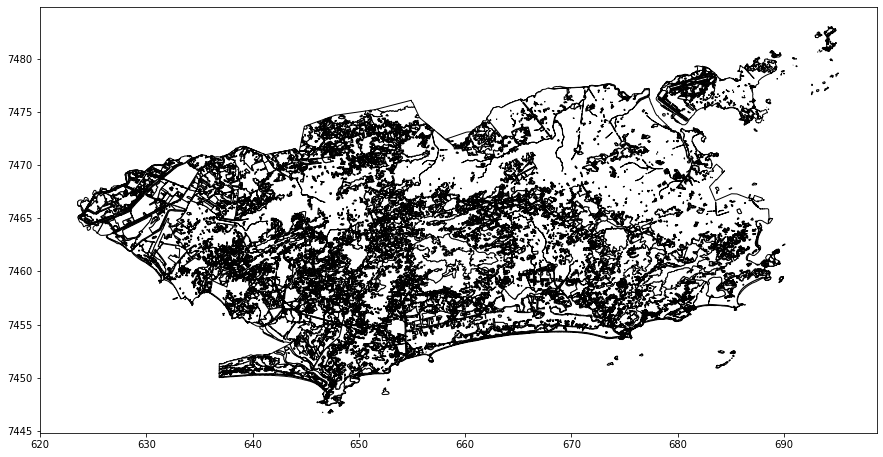

In [83]:
praias.plot(color='white', edgecolor='black', figsize=(15,8))

In [84]:
praias['legenda'].value_counts()

Vegetação arbórea não florestal                                     3492
Vegetação gramíneo-lenhosa                                          1993
Áreas Urbanas                                                        636
Floresta Ombrófila Densa, Estágio Inicial                            627
Afloramento Rochoso                                                  471
Uso agrícola, Lavoura Permanente                                     438
Floresta Ombrófila Densa, Estágio Médio                              406
Corpos d’água continentais                                           388
Reflorestamento                                                      252
Formação Pioneira com influência flúvio-lacustre, Brejo herbáceo     210
Uso agrícola, Lavoura Temporária                                     164
Formação Pioneira com influência flúvio-marinha, Manguezal           161
Formação Pioneira com influência flúvio-marinha, Campo Salino        150
Solo exposto                                       

In [85]:
praias = praias[praias.legenda == 'Praia']

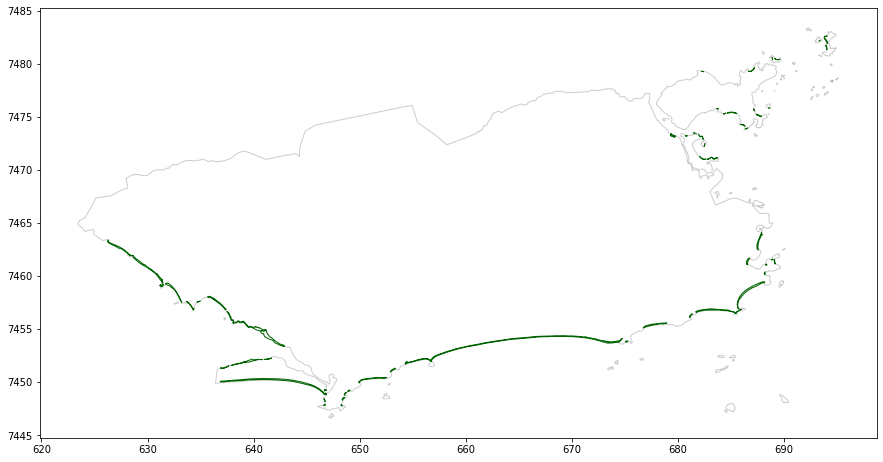

In [86]:
base = rj.plot(color='white', edgecolor='black', alpha=0.2, figsize=(15,8))
praias.plot(ax=base, color='white', edgecolor='darkgreen')

In [87]:
geo_dados['Dist_Praia'] = geo_dados['geometry'].apply(lambda x: praias.distance(x).min())
geo_dados.head()

,Area,Bairro,Cidade,Endereco,Estado,Latitude,Longitude,Quartos,Suites,Vagas,Tipo,Transacao,Valor,geometry,Dist_Metro,Dist_Transporte,Dist_Praia
0,138,Recreio dos Bandeirantes,Rio de Janeiro,Rua Vicente Scofano,RJ,-23.016455,-43.462946,3,1,3,Apartamento,Venda,1095000,POINT (657.514 7453.832),15.622939,0.443193,1.143453
1,133,Freguesia (Jacarepaguá),Rio de Janeiro,Rua Potiguara,RJ,-22.943199,-43.336911,3,1,2,Apartamento,Venda,650000,POINT (670.524 7461.803),7.530741,3.642787,7.478698
2,46,Pilares,Rio de Janeiro,Rua Professor Carneiro Felipe,RJ,-22.873849,-43.300517,1,0,0,Apartamento,Venda,150000,POINT (674.345 7469.440),0.736973,0.641470,6.240694
3,65,Barra da Tijuca,Rio de Janeiro,Avenida Salvador Allende,RJ,-22.984787,-43.412703,2,1,1,Apartamento,Venda,430000,POINT (662.701 7457.284),10.718039,0.422370,3.404589
5,260,Recreio dos Bandeirantes,Rio de Janeiro,Rua Desembargador Paulo Alonso,RJ,-23.018927,-43.477505,3,1,2,Apartamento,Venda,1160000,POINT (656.019 7453.574),17.131159,0.214605,1.369015


In [88]:
geo_dados.corr()

,Area,Latitude,Longitude,Quartos,Suites,Vagas,Valor,Dist_Metro,Dist_Transporte,Dist_Praia
Area,1.000000,-0.289299,0.029982,0.681112,0.585817,0.594699,0.724397,-0.036671,-0.042684,-0.290745
Latitude,-0.289299,1.000000,0.292822,-0.225226,-0.346480,-0.274707,-0.299038,-0.217864,0.358735,0.560706
Longitude,0.029982,0.292822,1.000000,-0.016882,-0.221548,-0.283960,0.191868,-0.874788,-0.031812,-0.317743
Quartos,0.681112,-0.225226,-0.016882,1.000000,0.529611,0.520499,0.481216,0.021794,-0.014628,-0.185830
Suites,0.585817,-0.346480,-0.221548,0.529611,1.000000,0.621140,0.464075,0.188521,0.006363,-0.196555
Vagas,0.594699,-0.274707,-0.283960,0.520499,0.621140,1.000000,0.456596,0.215787,0.070240,-0.104571
Valor,0.724397,-0.299038,0.191868,0.481216,0.464075,0.456596,1.000000,-0.195641,-0.103653,-0.361520
Dist_Metro,-0.036671,-0.217864,-0.874788,0.021794,0.188521,0.215787,-0.195641,1.000000,0.261040,0.187804
Dist_Transporte,-0.042684,0.358735,-0.031812,-0.014628,0.006363,0.070240,-0.103653,0.261040,1.000000,0.230640
Dist_Praia,-0.290745,0.560706,-0.317743,-0.185830,-0.196555,-0.104571,-0.361520,0.187804,0.230640,1.000000


In [89]:
geo_dados.to_file('/content/Mapas/RJ-DATASET/DATASET.shp')

# Parte 2: Visualização com mapas interativos

## Setores censitários

### Fontes
* https://geoftp.ibge.gov.br/recortes_para_fins_estatisticos/malha_de_setores_censitarios/censo_2010/base_de_faces_de_logradouros_versao_2019/
* https://cidades.ibge.gov.br/brasil/panorama

In [90]:
dir = '/content/01.Dados/Mapas/RJ-SETOR/TEMP'
if not os.path.exists(dir):
    os.makedirs(dir)

In [91]:
# faz download do arquivo contendo os dados que serão usados nesta análise
 
file_url = "https://caelum-online-public.s3.amazonaws.com/1007-geopandas-visualizacao-mapas-interativos/01/RJ-SETOR.zip"
	
r = requests.get(file_url, stream = True) 

with open("/content/RJ-SETOR.zip", "wb") as file: 
	for block in r.iter_content(chunk_size = 1024): 
		if block: 
			file.write(block) 
   



#descompacta o arquivo baixado anteriormente

!unzip "/content/RJ-SETOR.zip" -d "/content"

Archive:  /content/RJ-SETOR.zip
replace /content/01.Dados/Mapas/RJ-SETOR/DADOS/33045570539.zip? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [92]:
filenames = []
for root, dirs, files in os.walk('/content/01.Dados/Mapas/RJ-SETOR/DADOS'):
    filenames = files

filenames

['33045570523.zip',
 '33045570528.zip',
 '33045570531.zip',
 '33045570506.zip',
 '33045570534.zip',
 '33045570526.zip',
 '33045570536.zip',
 '33045570510.zip',
 '33045570520.zip',
 '33045570515.zip',
 '33045570517.zip',
 '33045570513.zip',
 '33045570522.zip',
 '33045570532.zip',
 '33045570537.zip',
 '33045570530.zip',
 '33045570527.zip',
 '33045570519.zip',
 '33045570509.zip',
 '33045570508.zip',
 '33045570507.zip',
 '33045570516.zip',
 '33045570514.zip',
 '33045570511.zip',
 '33045570539.zip',
 '33045570525.zip',
 '33045570512.zip',
 '33045570521.zip',
 '33045570533.zip',
 '33045570538.zip',
 '33045570535.zip',
 '33045570524.zip',
 '33045570529.zip']

In [93]:
for item in filenames:
    zip_ref = zipfile.ZipFile('/content/01.Dados/Mapas/RJ-SETOR/DADOS/' + item, 'r')
    zip_ref.extractall(dir)
    zip_ref.close()

In [94]:
filenames[0][:-4]

'33045570523'

In [95]:
[gpd.read_file(dir + '/' + item[:-4] + '_setor.shp') for item in filenames]

[        ID1  ...                                           geometry
 0    405885  ...  POLYGON ((-43.54904 -22.87789, -43.54917 -22.8...
 1    405886  ...  POLYGON ((-43.60575 -22.87973, -43.60549 -22.8...
 2    405887  ...  POLYGON ((-43.61701 -22.88076, -43.61570 -22.8...
 3    405888  ...  POLYGON ((-43.51433 -22.87196, -43.51440 -22.8...
 4    405873  ...  POLYGON ((-43.61809 -22.88209, -43.61823 -22.8...
 ..      ...  ...                                                ...
 855  405177  ...  POLYGON ((-43.59941 -22.91824, -43.59917 -22.9...
 856  405178  ...  POLYGON ((-43.54860 -22.90662, -43.54819 -22.9...
 857  405179  ...  POLYGON ((-43.55012 -22.86524, -43.55180 -22.8...
 858  405180  ...  POLYGON ((-43.62116 -22.90465, -43.62114 -22.9...
 859  405181  ...  POLYGON ((-43.62119 -22.91159, -43.62119 -22.9...
 
 [860 rows x 14 columns],
        ID1  ...                                           geometry
 0   409508  ...  POLYGON ((-43.18478 -22.92089, -43.18480 -22.9...
 1   409

In [96]:
setor = pd.concat([gpd.read_file(dir + '/' + item[:-4] + '_setor.shp') for item in filenames], ignore_index=True)
setor.head()

,ID1,CD_GEOCODI,TIPO,CD_GEOCODB,NM_BAIRRO,CD_GEOCODD,NM_DISTRIT,CD_GEOCODS,NM_SUBDIST,CD_GEOCODM,NM_MUNICIP,NM_MESO,NM_MICRO,geometry
0,405885,330455705230684,URBANO,330455705102,Campo Grande,330455705,RIO DE JANEIRO,330455705,CAMPO GRANDE,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((-43.54904 -22.87789, -43.54917 -22.8..."
1,405886,330455705230685,URBANO,330455705102,Campo Grande,330455705,RIO DE JANEIRO,330455705,CAMPO GRANDE,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((-43.60575 -22.87973, -43.60549 -22.8..."
2,405887,330455705230686,URBANO,330455705102,Campo Grande,330455705,RIO DE JANEIRO,330455705,CAMPO GRANDE,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((-43.61701 -22.88076, -43.61570 -22.8..."
3,405888,330455705230687,URBANO,330455705101,Santíssimo,330455705,RIO DE JANEIRO,330455705,CAMPO GRANDE,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((-43.51433 -22.87196, -43.51440 -22.8..."
4,405873,330455705230200,URBANO,330455705102,Campo Grande,330455705,RIO DE JANEIRO,330455705,CAMPO GRANDE,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((-43.61809 -22.88209, -43.61823 -22.8..."


In [97]:
setor = setor.to_crs('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')
setor.crs

<Bound CRS: +proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0, ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (kilometre)
- N[north]: Northing (kilometre)
Area of Use:
- undefined
Coordinate Operation:
- name: Transformation from unknown to WGS84
- method: Position Vector transformation (geog2D domain)
Datum: Unknown based on GRS80 ellipsoid
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich
Source CRS: unknown

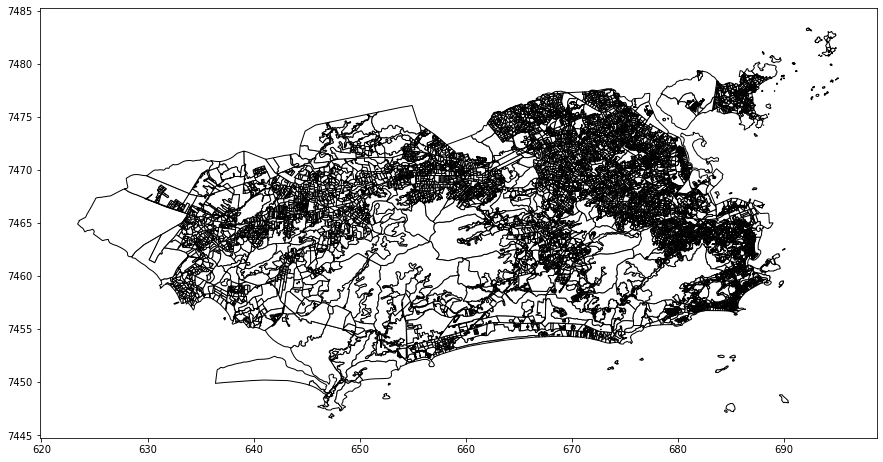

In [98]:
setor.plot(color='white', edgecolor='black', figsize=(15,8))

In [99]:
geo_dados.to_file('/content/Mapas/RJ-DATASET/DATASET.shp')

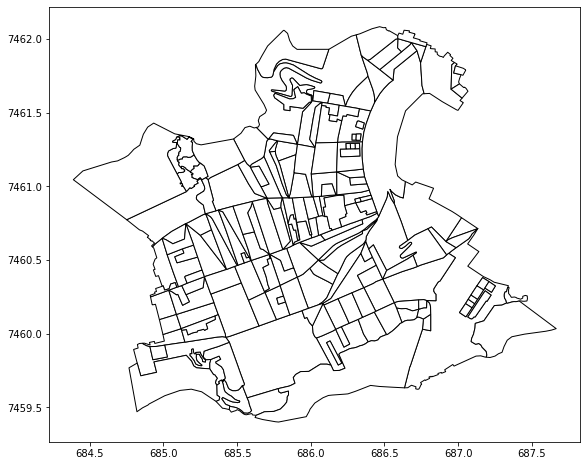

In [100]:
botafogo = setor[setor['NM_BAIRRO'] == 'Botafogo']
botafogo.plot(color='white', edgecolor='black', figsize=(15,8))

## Dados censitários

### Novas fontes de dados
* https://ftp.ibge.gov.br/
* https://ftp.ibge.gov.br/Censos/Censo_Demografico_2010/Resultados_do_Universo/Agregados_por_Setores_Censitarios/Documentacao_Agregado_dos_Setores_20180416.zip (contém, entre outras coisas, um pdf que consta os dicionários para cada dataset)
* https://ftp.ibge.gov.br/Censos/Censo_Demografico_2010/Resultados_do_Universo/Agregados_por_Setores_Censitarios/RJ_20171016.zip

In [101]:
# faz download do arquivo contendo os dados que serão usados nesta análise
 
file_url = "https://ftp.ibge.gov.br/Censos/Censo_Demografico_2010/Resultados_do_Universo/Agregados_por_Setores_Censitarios/Documentacao_Agregado_dos_Setores_20180416.zip"
r = requests.get(file_url, stream = True) 

with open("/content/documentacao.zip", "wb") as file: 
	for block in r.iter_content(chunk_size = 1024): 
		if block: 
			file.write(block) 
   



#descompacta o arquivo baixado anteriormente

!unzip "/content/documentacao.zip" -d "/content"

Archive:  /content/documentacao.zip
replace /content/DocumentaЗ╞o/BASE DE INFORMAАхES POR SETOR CENSIT╡RIO Censo 2010 - Universo.doc? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [102]:
# faz download do arquivo contendo os dados que serão usados nesta análise
 
file_url = "https://ftp.ibge.gov.br/Censos/Censo_Demografico_2010/Resultados_do_Universo/Agregados_por_Setores_Censitarios/RJ_20171016.zip"
r = requests.get(file_url, stream = True) 

with open("/content/RJ_20171016.zip", "wb") as file: 
	for block in r.iter_content(chunk_size = 1024): 
		if block: 
			file.write(block) 
   



#descompacta o arquivo baixado anteriormente

!unzip "/content/RJ_20171016.zip" -d "/content"

Archive:  /content/RJ_20171016.zip
replace /content/RJ/Base informaçoes setores2010 universo RJ/CSV/Basico_RJ.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: N


In [103]:
censo = pd.read_excel('/content/RJ/Base informaçoes setores2010 universo RJ/EXCEL/Basico_RJ.xls')
censo.head()

,Cod_setor,Cod_Grandes Regiões,Nome_Grande_Regiao,Cod_UF,Nome_da_UF,Cod_meso,Nome_da_meso,Cod_micro,Nome_da_micro,Cod_RM,Nome_da_RM,Cod_municipio,Nome_do_municipio,Cod_distrito,Nome_do_distrito,Cod_subdistrito,Nome_do_subdistrito,Cod_bairro,Nome_do_bairro,Situacao_setor,Tipo_setor,V001,V002,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
0,330010005000001,3,Região Sudeste,RJ,Rio de Janeiro,3305,Sul Fluminense,33013,Baía da Ilha Grande,0,Municípios não pertencentes a estrutura de RM,3300100,ANGRA DOS REIS,330010005,ANGRA DOS REIS,33001000500,ANGRA DOS REIS,3300100010,CENTRO,1,0,156.0,409.0,2.62,1.94,2356.80,5716056.06,2571.06,5684616.94,1565.37,4344465.56,2192.65,4711305.89
1,330010005000002,3,Região Sudeste,RJ,Rio de Janeiro,3305,Sul Fluminense,33013,Baía da Ilha Grande,0,Municípios não pertencentes a estrutura de RM,3300100,ANGRA DOS REIS,330010005,ANGRA DOS REIS,33001000500,ANGRA DOS REIS,3300100010,CENTRO,1,0,57.0,143.0,2.51,1.50,2040.47,3020377.79,2236.67,2869054.77,1816.69,20052928.88,2375.67,24942113.99
2,330010005000003,3,Região Sudeste,RJ,Rio de Janeiro,3305,Sul Fluminense,33013,Baía da Ilha Grande,0,Municípios não pertencentes a estrutura de RM,3300100,ANGRA DOS REIS,330010005,ANGRA DOS REIS,33001000500,ANGRA DOS REIS,3300100010,CENTRO,1,0,343.0,1055.0,3.08,2.19,2687.80,8362007.52,2836.66,8402987.99,1593.37,7250920.66,2294.84,8835722.10
3,330010005000004,3,Região Sudeste,RJ,Rio de Janeiro,3305,Sul Fluminense,33013,Baía da Ilha Grande,0,Municípios não pertencentes a estrutura de RM,3300100,ANGRA DOS REIS,330010005,ANGRA DOS REIS,33001000500,ANGRA DOS REIS,3300100010,CENTRO,1,0,72.0,219.0,3.04,3.25,3026.67,24807309.86,3352.62,26410753.99,1865.52,10994097.59,2574.41,13362652.63
4,330010005000005,3,Região Sudeste,RJ,Rio de Janeiro,3305,Sul Fluminense,33013,Baía da Ilha Grande,0,Municípios não pertencentes a estrutura de RM,3300100,ANGRA DOS REIS,330010005,ANGRA DOS REIS,33001000500,ANGRA DOS REIS,3300100025,MORRO DO ABEL,1,0,212.0,709.0,3.34,1.94,1124.82,712447.24,1229.19,649944.69,689.40,583588.50,1028.21,521878.03


In [104]:
censo.dtypes

Cod_setor                int64
Cod_Grandes Regiões      int64
Nome_Grande_Regiao      object
Cod_UF                  object
Nome_da_UF              object
Cod_meso                 int64
Nome_da_meso            object
Cod_micro                int64
Nome_da_micro           object
Cod_RM                   int64
Nome_da_RM              object
Cod_municipio            int64
Nome_do_municipio       object
Cod_distrito             int64
Nome_do_distrito        object
Cod_subdistrito          int64
Nome_do_subdistrito     object
Cod_bairro               int64
Nome_do_bairro          object
Situacao_setor           int64
Tipo_setor               int64
V001                   float64
V002                   float64
V003                   float64
V004                   float64
V005                   float64
V006                   float64
V007                   float64
V008                   float64
V009                   float64
V010                   float64
V011                   float64
V012    

In [105]:
setor.dtypes

ID1              int64
CD_GEOCODI      object
TIPO            object
CD_GEOCODB      object
NM_BAIRRO       object
CD_GEOCODD      object
NM_DISTRIT      object
CD_GEOCODS      object
NM_SUBDIST      object
CD_GEOCODM      object
NM_MUNICIP      object
NM_MESO         object
NM_MICRO        object
geometry      geometry
dtype: object

In [106]:
censo.Cod_setor = censo.Cod_setor.astype(str)
censo.dtypes

Cod_setor               object
Cod_Grandes Regiões      int64
Nome_Grande_Regiao      object
Cod_UF                  object
Nome_da_UF              object
Cod_meso                 int64
Nome_da_meso            object
Cod_micro                int64
Nome_da_micro           object
Cod_RM                   int64
Nome_da_RM              object
Cod_municipio            int64
Nome_do_municipio       object
Cod_distrito             int64
Nome_do_distrito        object
Cod_subdistrito          int64
Nome_do_subdistrito     object
Cod_bairro               int64
Nome_do_bairro          object
Situacao_setor           int64
Tipo_setor               int64
V001                   float64
V002                   float64
V003                   float64
V004                   float64
V005                   float64
V006                   float64
V007                   float64
V008                   float64
V009                   float64
V010                   float64
V011                   float64
V012    

In [107]:
print(type(censo))
print(type(setor))

<class 'pandas.core.frame.DataFrame'>
<class 'geopandas.geodataframe.GeoDataFrame'>


In [108]:
setor = pd.merge(setor, censo, left_on='CD_GEOCODI', right_on='Cod_setor', how='left')
setor.head()

,ID1,CD_GEOCODI,TIPO,CD_GEOCODB,NM_BAIRRO,CD_GEOCODD,NM_DISTRIT,CD_GEOCODS,NM_SUBDIST,CD_GEOCODM,NM_MUNICIP,NM_MESO,NM_MICRO,geometry,Cod_setor,Cod_Grandes Regiões,Nome_Grande_Regiao,Cod_UF,Nome_da_UF,Cod_meso,Nome_da_meso,Cod_micro,Nome_da_micro,Cod_RM,Nome_da_RM,Cod_municipio,Nome_do_municipio,Cod_distrito,Nome_do_distrito,Cod_subdistrito,Nome_do_subdistrito,Cod_bairro,Nome_do_bairro,Situacao_setor,Tipo_setor,V001,V002,V003,V004,V005,V006,V007,V008,V009,V010,V011,V012
0,405885,330455705230684,URBANO,330455705102,Campo Grande,330455705,RIO DE JANEIRO,330455705,CAMPO GRANDE,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((648.841 7469.265, 648.828 7469.264, ...",330455705230684,3.0,Região Sudeste,RJ,Rio de Janeiro,3306.0,Metropolitana do Rio de Janeiro,33018.0,Rio de Janeiro,19.0,RM Rio de Janeiro,3304557.0,RIO DE JANEIRO,330455705.0,RIO DE JANEIRO,3.304557e+10,CAMPO GRANDE,3.304557e+09,Campo Grande,1.0,1.0,4.0,13.0,3.25,0.92,855.00,165366.67,855.00,165366.67,429.09,228489.09,786.67,119426.67
1,405886,330455705230685,URBANO,330455705102,Campo Grande,330455705,RIO DE JANEIRO,330455705,CAMPO GRANDE,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((643.021 7469.117, 643.048 7469.101, ...",330455705230685,3.0,Região Sudeste,RJ,Rio de Janeiro,3306.0,Metropolitana do Rio de Janeiro,33018.0,Rio de Janeiro,19.0,RM Rio de Janeiro,3304557.0,RIO DE JANEIRO,330455705.0,RIO DE JANEIRO,3.304557e+10,CAMPO GRANDE,3.304557e+09,Campo Grande,1.0,0.0,187.0,609.0,3.26,2.60,842.83,412582.52,943.77,366455.88,475.75,351617.45,836.55,316335.14
2,405887,330455705230686,URBANO,330455705102,Campo Grande,330455705,RIO DE JANEIRO,330455705,CAMPO GRANDE,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((641.865 7469.014, 641.998 7468.943, ...",330455705230686,3.0,Região Sudeste,RJ,Rio de Janeiro,3306.0,Metropolitana do Rio de Janeiro,33018.0,Rio de Janeiro,19.0,RM Rio de Janeiro,3304557.0,RIO DE JANEIRO,330455705.0,RIO DE JANEIRO,3.304557e+10,CAMPO GRANDE,3.304557e+09,Campo Grande,1.0,0.0,182.0,577.0,3.17,3.02,622.87,302418.01,776.46,257426.02,403.01,256944.50,732.61,225497.89
3,405888,330455705230687,URBANO,330455705101,Santíssimo,330455705,RIO DE JANEIRO,330455705,CAMPO GRANDE,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((652.409 7469.886, 652.402 7469.893, ...",330455705230687,3.0,Região Sudeste,RJ,Rio de Janeiro,3306.0,Metropolitana do Rio de Janeiro,33018.0,Rio de Janeiro,19.0,RM Rio de Janeiro,3304557.0,RIO DE JANEIRO,330455705.0,RIO DE JANEIRO,3.304557e+10,CAMPO GRANDE,3.304557e+09,Santíssimo,1.0,0.0,367.0,1106.0,3.01,2.16,1077.29,1022746.01,1190.86,995236.06,715.15,885666.58,1074.99,944574.19
4,405873,330455705230200,URBANO,330455705102,Campo Grande,330455705,RIO DE JANEIRO,330455705,CAMPO GRANDE,3304557,RIO DE JANEIRO,METROPOLITANA DO RIO DE JANEIRO,RIO DE JANEIRO,"POLYGON ((641.752 7468.868, 641.738 7468.834, ...",330455705230200,3.0,Região Sudeste,RJ,Rio de Janeiro,3306.0,Metropolitana do Rio de Janeiro,33018.0,Rio de Janeiro,19.0,RM Rio de Janeiro,3304557.0,RIO DE JANEIRO,330455705.0,RIO DE JANEIRO,3.304557e+10,CAMPO GRANDE,3.304557e+09,Campo Grande,1.0,0.0,222.0,696.0,3.14,1.79,1084.03,1315730.86,1344.44,1281506.28,784.00,1219130.57,1256.83,1360481.01


In [109]:
setor.columns

Index(['ID1', 'CD_GEOCODI', 'TIPO', 'CD_GEOCODB', 'NM_BAIRRO', 'CD_GEOCODD',
       'NM_DISTRIT', 'CD_GEOCODS', 'NM_SUBDIST', 'CD_GEOCODM', 'NM_MUNICIP',
       'NM_MESO', 'NM_MICRO', 'geometry', 'Cod_setor', 'Cod_Grandes Regiões',
       'Nome_Grande_Regiao', 'Cod_UF', 'Nome_da_UF ', 'Cod_meso',
       'Nome_da_meso', 'Cod_micro', 'Nome_da_micro', 'Cod_RM', 'Nome_da_RM',
       'Cod_municipio', 'Nome_do_municipio', 'Cod_distrito',
       'Nome_do_distrito', 'Cod_subdistrito', 'Nome_do_subdistrito',
       'Cod_bairro', 'Nome_do_bairro', 'Situacao_setor', 'Tipo_setor', 'V001',
       'V002', 'V003', 'V004', 'V005', 'V006', 'V007', 'V008', 'V009', 'V010',
       'V011', 'V012'],
      dtype='object')

In [110]:
setor.crs

<Bound CRS: +proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0, ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (kilometre)
- N[north]: Northing (kilometre)
Area of Use:
- undefined
Coordinate Operation:
- name: Transformation from unknown to WGS84
- method: Position Vector transformation (geog2D domain)
Datum: Unknown based on GRS80 ellipsoid
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich
Source CRS: unknown

In [111]:
setor.to_file('/content/01.Dados/Mapas/RJ-SETOR/RJ-SETOR.shp')

## Juntando os dados censitários ao dataset

In [112]:
geo_dados

,Area,Bairro,Cidade,Endereco,Estado,Latitude,Longitude,Quartos,Suites,Vagas,Tipo,Transacao,Valor,geometry,Dist_Metro,Dist_Transporte,Dist_Praia
0,138,Recreio dos Bandeirantes,Rio de Janeiro,Rua Vicente Scofano,RJ,-23.016455,-43.462946,3,1,3,Apartamento,Venda,1095000,POINT (657.514 7453.832),15.622939,0.443193,1.143453
1,133,Freguesia (Jacarepaguá),Rio de Janeiro,Rua Potiguara,RJ,-22.943199,-43.336911,3,1,2,Apartamento,Venda,650000,POINT (670.524 7461.803),7.530741,3.642787,7.478698
2,46,Pilares,Rio de Janeiro,Rua Professor Carneiro Felipe,RJ,-22.873849,-43.300517,1,0,0,Apartamento,Venda,150000,POINT (674.345 7469.440),0.736973,0.641470,6.240694
3,65,Barra da Tijuca,Rio de Janeiro,Avenida Salvador Allende,RJ,-22.984787,-43.412703,2,1,1,Apartamento,Venda,430000,POINT (662.701 7457.284),10.718039,0.422370,3.404589
5,260,Recreio dos Bandeirantes,Rio de Janeiro,Rua Desembargador Paulo Alonso,RJ,-23.018927,-43.477505,3,1,2,Apartamento,Venda,1160000,POINT (656.019 7453.574),17.131159,0.214605,1.369015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,48,Campo Grande,Rio de Janeiro,Rua Josué de Barros,RJ,-22.878349,-43.550762,2,0,1,Apartamento,Venda,170000,POINT (648.664 7469.216),20.667831,2.129366,16.133493
4996,75,Recreio dos Bandeirantes,Rio de Janeiro,Rua Le Corbusier,RJ,-23.024717,-43.487285,3,1,1,Apartamento,Venda,550000,POINT (655.010 7452.944),18.189134,0.563492,0.955964
4997,32,Jardim Botânico,Rio de Janeiro,Rua Getúlio das Neves,RJ,-22.959433,-43.206180,1,0,0,Apartamento,Venda,580000,POINT (683.909 7459.848),2.180300,2.180300,2.612550
4998,85,Grajaú,Rio de Janeiro,Rua Jerônimo de Lemos,RJ,-22.918773,-43.260492,3,0,0,Apartamento,Venda,325000,POINT (678.393 7464.417),2.558248,1.871081,7.679812


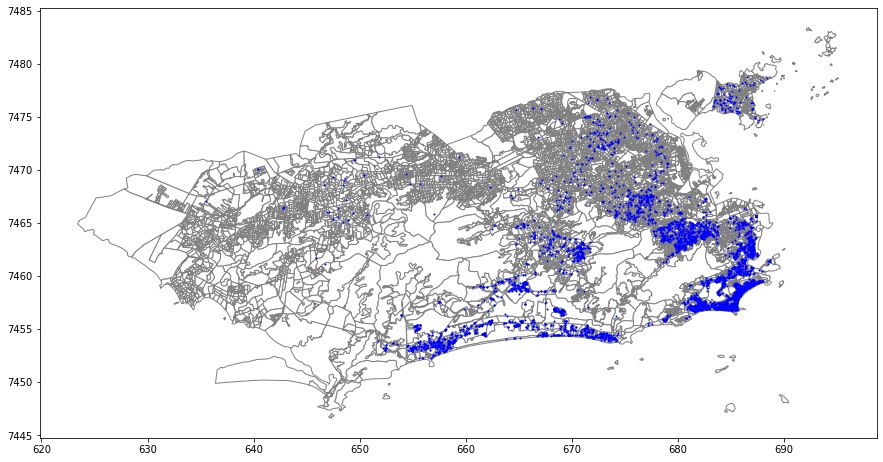

In [113]:
base = setor.plot(color='white', edgecolor='grey', figsize=(15,8))
geo_dados.plot(ax=base, color='blue', markersize=1)

In [114]:
geo_dados.shape

(4513, 17)

In [115]:
# !pip install rtree

In [116]:
geo_dados = gpd.sjoin(geo_dados, setor, how='left', op='within')

In [117]:
geo_dados.shape

(4516, 64)

In [118]:
~geo_dados.index.duplicated(keep='first')

array([ True,  True,  True, ...,  True,  True,  True])

In [119]:
geo_dados = geo_dados[~geo_dados.index.duplicated(keep='first')]

In [120]:
geo_dados.shape

(4513, 64)

In [122]:
geo_dados.to_file('/content/Mapas/RJ-DATASET/DATASET.shp')

## Agregando regiões geográficas

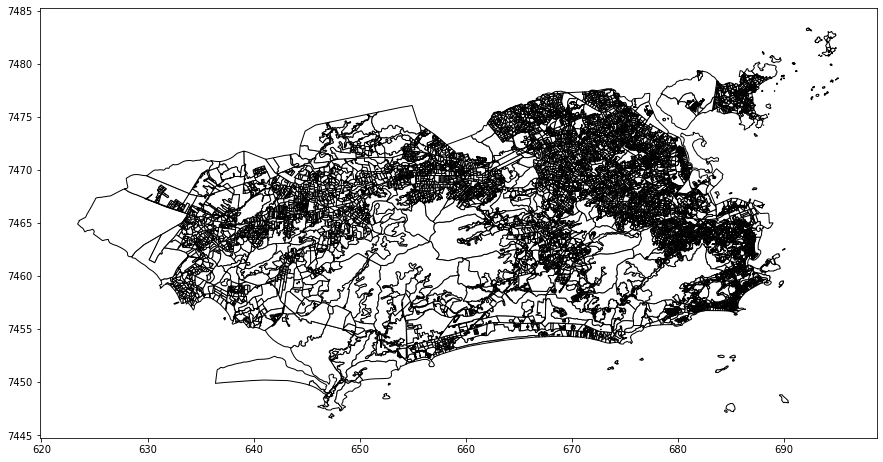

In [123]:
setor.plot(color='white', edgecolor='black', figsize=(15,8))

In [124]:
setor = setor.to_crs({'init':'epsg:4326'})
setor_m = setor[['NM_BAIRRO', 'geometry']]

/usr/local/lib/python3.6/dist-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [125]:
bairro = setor_m.dissolve(by='NM_BAIRRO')

In [126]:
bairro

,geometry
NM_BAIRRO,
Abolição,"POLYGON ((-43.29489 -22.88916, -43.29457 -22.8..."
Acari,"POLYGON ((-43.33882 -22.82658, -43.33949 -22.8..."
Alto da Boa Vista,"POLYGON ((-43.29377 -22.97986, -43.29380 -22.9..."
Anchieta,"POLYGON ((-43.41112 -22.83336, -43.41115 -22.8..."
Andaraí,"POLYGON ((-43.25436 -22.93422, -43.25436 -22.9..."
...,...
Vila Valqueire,"POLYGON ((-43.36722 -22.89664, -43.36718 -22.8..."
Vila da Penha,"POLYGON ((-43.30720 -22.84905, -43.30738 -22.8..."
Vista Alegre,"POLYGON ((-43.30903 -22.83303, -43.30909 -22.8..."


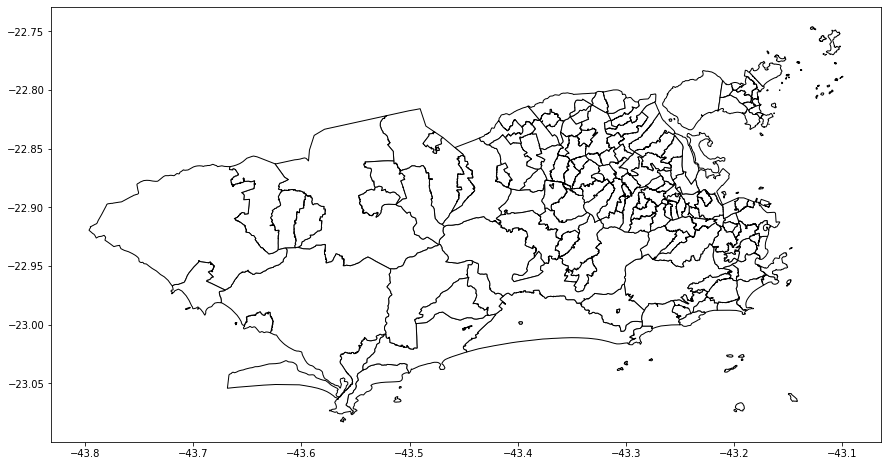

In [127]:
bairro.plot(color='white', edgecolor='black', figsize=(15,8))

In [128]:
setor_m = setor[['NM_BAIRRO', 'geometry', 'V002']]

In [129]:
bairro = setor_m.dissolve(by='NM_BAIRRO', aggfunc='sum')

In [130]:
bairro

,geometry,V002
NM_BAIRRO,,
Abolição,"POLYGON ((-43.29489 -22.88916, -43.29457 -22.8...",11356.0
Acari,"POLYGON ((-43.33882 -22.82658, -43.33949 -22.8...",26967.0
Alto da Boa Vista,"POLYGON ((-43.29377 -22.97986, -43.29380 -22.9...",9189.0
Anchieta,"POLYGON ((-43.41112 -22.83336, -43.41115 -22.8...",55634.0
Andaraí,"POLYGON ((-43.25436 -22.93422, -43.25436 -22.9...",39325.0
...,...,...
Vila Valqueire,"POLYGON ((-43.36722 -22.89664, -43.36718 -22.8...",32232.0
Vila da Penha,"POLYGON ((-43.30720 -22.84905, -43.30738 -22.8...",25462.0
Vista Alegre,"POLYGON ((-43.30903 -22.83303, -43.30909 -22.8...",8622.0


In [131]:
setor_m['V002'].sum()

6283486.0

In [132]:
bairro['V002'].sum()

6283486.0

In [133]:
bairro = bairro.to_crs('+proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0,0,0,0,0,0,0 +units=km +no_defs')
bairro.crs

<Bound CRS: +proj=utm +zone=23 +south +ellps=GRS80 +towgs84=0, ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (kilometre)
- N[north]: Northing (kilometre)
Area of Use:
- undefined
Coordinate Operation:
- name: Transformation from unknown to WGS84
- method: Position Vector transformation (geog2D domain)
Datum: Unknown based on GRS80 ellipsoid
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich
Source CRS: unknown

In [134]:
bairro.reset_index(inplace=True)
bairro.head()

,NM_BAIRRO,geometry,V002
0,Abolição,"POLYGON ((674.902 7467.737, 674.936 7467.767, ...",11356.0
1,Acari,"POLYGON ((670.474 7474.718, 670.405 7474.689, ...",26967.0
2,Alto da Boa Vista,"POLYGON ((674.901 7457.693, 674.898 7457.693, ...",9189.0
3,Anchieta,"POLYGON ((663.045 7474.050, 663.041 7474.046, ...",55634.0
4,Andaraí,"POLYGON ((679.002 7462.700, 679.002 7462.700, ...",39325.0


In [135]:
dir = '/content/01.Dados/Mapas/RJ-BAIRRO'
if not os.path.exists(dir):
    os.makedirs(dir)

bairro.to_file(dir + '/RJ-BAIRRO.shp')

## Gerando Visualizações dos dados

Ajuda do Folium:
* https://python-visualization.github.io/folium/quickstart.html

Exemplos:
* https://nbviewer.jupyter.org/github/python-visualization/folium/tree/master/examples/
* https://nbviewer.jupyter.org/github/python-visualization/folium_contrib/tree/master/notebooks/

In [136]:
import folium

In [137]:
crs="EPSG:4326"

In [138]:
setor = setor.fillna(0)

In [139]:
rj.to_crs(crs, inplace=True)
rj.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [140]:
y = rj.centroid.y.iloc[0]
y

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  """Entry point for launching an IPython kernel.


-22.92318738485854

In [141]:
x = rj.centroid.x.iloc[0]
x

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  """Entry point for launching an IPython kernel.


-43.45025729553385

In [142]:
rj

,ID,CD_GEOCODM,NM_MUNICIP,geometry
67,1535,3304557,RIO DE JANEIRO,"MULTIPOLYGON (((-43.12376 -22.80712, -43.12380..."


## Mapa camada simples

In [143]:
base = folium.Map([y, x], zoom_start=11)
base.choropleth(rj)
base

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [144]:
base = folium.Map([y, x], zoom_start=11)
geojson_rj = folium.GeoJson(rj)
geojson_rj.add_child(folium.Popup(rj.NM_MUNICIP.iloc[0]))
geojson_rj.add_to(base)
base

## Mapa várias camadas

In [145]:
bairro

,NM_BAIRRO,geometry,V002
0,Abolição,"POLYGON ((674.902 7467.737, 674.936 7467.767, ...",11356.0
1,Acari,"POLYGON ((670.474 7474.718, 670.405 7474.689, ...",26967.0
2,Alto da Boa Vista,"POLYGON ((674.901 7457.693, 674.898 7457.693, ...",9189.0
3,Anchieta,"POLYGON ((663.045 7474.050, 663.041 7474.046, ...",55634.0
4,Andaraí,"POLYGON ((679.002 7462.700, 679.002 7462.700, ...",39325.0
...,...,...,...
155,Vila Valqueire,"POLYGON ((667.473 7466.993, 667.477 7466.985, ...",32232.0
156,Vila da Penha,"POLYGON ((673.691 7472.193, 673.672 7472.177, ...",25462.0
157,Vista Alegre,"POLYGON ((673.524 7473.970, 673.517 7473.968, ...",8622.0
158,Zumbi,"POLYGON ((687.240 7474.829, 687.239 7474.833, ...",2016.0


In [146]:
bairro.to_crs(crs, inplace=True)
bairro

,NM_BAIRRO,geometry,V002
0,Abolição,"POLYGON ((-43.29489 -22.88916, -43.29457 -22.8...",11356.0
1,Acari,"POLYGON ((-43.33882 -22.82658, -43.33949 -22.8...",26967.0
2,Alto da Boa Vista,"POLYGON ((-43.29377 -22.97986, -43.29380 -22.9...",9189.0
3,Anchieta,"POLYGON ((-43.41112 -22.83336, -43.41115 -22.8...",55634.0
4,Andaraí,"POLYGON ((-43.25436 -22.93422, -43.25436 -22.9...",39325.0
...,...,...,...
155,Vila Valqueire,"POLYGON ((-43.36722 -22.89664, -43.36718 -22.8...",32232.0
156,Vila da Penha,"POLYGON ((-43.30720 -22.84905, -43.30738 -22.8...",25462.0
157,Vista Alegre,"POLYGON ((-43.30903 -22.83303, -43.30909 -22.8...",8622.0
158,Zumbi,"POLYGON ((-43.17551 -22.82380, -43.17553 -22.8...",2016.0


In [147]:
base = folium.Map([y, x], zoom_start=11)

for i in range(len(bairro)):
    geo = folium.GeoJson(bairro[i:i+1], name=bairro.NM_BAIRRO[i])
    label = f'{bairro.NM_BAIRRO[i]} - {bairro.V002[i]} habitantes'
    folium.Popup(label).add_to(geo)
    geo.add_to(base)

folium.LayerControl().add_to(base)
base

## Mapa com marcadores

In [148]:
base = folium.Map([y, x], zoom_start=11)
base.choropleth(rj, 
                name='Rio de Janeiro', 
                line_color='Black',
                line_weight=3,
                fill_opacity=0)

amostra = geo_dados.sample(500)

# https://fontawesome.com/icons?from=io

for item in amostra.itertuples():
    base.add_child(folium.Marker(location=[item.Latitude, item.Longitude],
                                 popup='<h4>'+str(item.Tipo)+'</h4> <h5>'+str(item.Bairro)+'</h5> <p>R$'+str(item.Valor)+',00</p>',
                                 icon=folium.Icon(color='red',
                                                  prefix='fa',
                                                  icon='fas fa-home')))
    
folium.LayerControl().add_to(base)

base

/usr/local/lib/python3.6/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning
